#Problema 1: Polarización Elíptica

Simplemente basta con incluir un desfase

In [86]:
#Paquetes a utilizar
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import Image

class SimuladorPolarizacionEliptica(object):
  def __init__(self, freq = 300000000, epsr = 1, mur = 1, sigma = 0,

               ######################################################
               # 0.25 PUNTOS POR ASIGNAR LAS 4 VARIABLES DE ENTRADA #
               ######################################################
               E0x = 1, E0y=2, theta1 = 0, theta2 = 90):            #
               ######################################################

    #Constantes
    self.mu0 = 4 * np.pi * 10 ** (-7)               #Permeabilidad del vacío
    self.eps0 = 8.8542 * 10 ** (-12)                #Permitividaad del vacío
    self.c = 300 * 10 ** (6)                        #Velocidad de la luz en el vacío

    #Parámetros de la onda
    self.freq = freq                                #Frecuencia [Hz]
    self.omega = 2 * np.pi * self.freq              #Frecuencia [rad]

    ###########################################################################
    # 0.25 PUNTOS POR ASIGNAR LAS VARIABLES                                   #
    ###########################################################################
    self.E0x = E0x                                  #Amplitud inicial de Ex   #
    self.E0y = E0y                                  #Amplitud inicial de Ey   #
    self.theta1 = theta1                            #Desfase [°]              #
    self.theta2 = theta2                            #Desfase [°]              #
    self.theta1_rad = (self.theta1 * np.pi) / 180   #Desfase [rad]            #
    self.theta2_rad = (self.theta2 * np.pi) / 180   #Desfase [rad]            #
    ###########################################################################

    #Parámetros del medio
    self.mur = mur                                  #Permeabilidad relativa Medio
    self.epsr = epsr                                #Permitividad relativa Medio
    self.sigma = sigma                              #Conductividad Medio

    #Calculo de coeficientes y parámetros
    mu = self.mu0 * self.mur                        #Permeabilidad Medio 1
    eps = self.eps0 * self.epsr                     #Permitividad Medio 1
    self.alpha = 0                                  #Alpha Medio 1
    self.beta  = self.omega * np.sqrt(mu * eps)     #Beta Medio 1
    self.eta_mag = np.sqrt(mu / eps)                #Impedancia Medio 1 (magnitud)
    self.eta_phs = 0                                #Impedancia Medio 1 (fase)

    #Parámetros físicos:
    #Con estos escogeremos una ventana de tiempo y espacio apropiadas para la
    #simulación, de manera que podamos apreciar al menos 2 periodos de onda.
    self.lambda1 = 2 * np.pi / self.beta           #Longitud de onda Medio
    self.T = self.lambda1 * np.sqrt(mu * eps)    #Periodo de onda Medio

    #Parametros de grilla

    ###############################################################
    # 0.25 PUNTOS POR SETEAR LA GRILLA ESPACIAL                   #
    ###############################################################
    self.dz = self.lambda1 / 200                                  #
    self.zz = np.arange(0, 4 * self.lambda1 + self.dz, self.dz)   #
    ###############################################################

    ###############################################################
    # 0.25 PUNTOS POR SETEAR LA GRILLA TEMPORAL                   #
    ###############################################################
    self.dt = self.T/ 400                                         #
    self.tt = np.arange(0, 4 * self.T + self.dt, self.dt)         #
    ###############################################################

    #Vectores para almacenar datos
    #Los vectores E_zz y H_zz nos permitirán generar un frame de las
    #ondas eléctrica y magnética para un tiempo particular.
    self.Ex_zz = []
    self.Ey_zz = []
    #Los vectores E_tt y H_tt nos permitirán almacenar cada frame de
    #la simulación, para luego convertirlo en una animación.
    self.Ex_tt = []
    self.Ey_tt = []

  #Generamos la simulación
  def run(self):
    for i in range(0,len(self.tt)):

      ##############################################################
      # 0.5 PUNTOS POR AMBAS ECUACIONES DE ONDA                    #
      ##############################################################
      #Componente 1                                                #
      self.Ex_zz = self.E0x * np.cos(self.omega * self.tt[i] \
                   - self.beta * self.zz + self.theta1_rad)        #
      #Componente 2                                                #
      self.Ey_zz = self.E0y * np.cos(self.omega * self.tt[i] \
                   - self.beta * self.zz + self.theta2_rad)        #
      ##############################################################

      #Guardamos los frames
      self.Ex_tt.append(self.Ex_zz.copy())
      self.Ey_tt.append(self.Ey_zz.copy())

  #Graficamos el resultado
  def plot(self):
    fig = plt.figure(figsize = (10, 5))                   #Instanciamos figura
    ax = fig.add_subplot(111, projection='3d')            #Modo 3D
    ax.plot(self.zz, self.Ey_zz, self.Ex_zz, color = "r", linewidth = 2)   #Ploteamos E(z)
    plt.xlabel("Z")                                       #Label del "Eje z"
    plt.grid(True)                                        #Añadir grilla
    plt.title("Onda Eléctrica Polarizada Elípticamente")  #Título
    plt.show()                                            #Desplegar

  #Generar un gif para la simulación
  def animate(self, file_dir = "OndaPE.gif", N = 200, az = 45, el=30):
    Ex_tt = self.Ex_tt[-N:]                                 #Tomamos ultimos N frames de E_tt
    Ey_tt = self.Ey_tt[-N:]                                 #Tomamos ultimos N frames de E_tt

    #Le damos formato a la gráfica de la animación
    fig = plt.figure(figsize = (5, 5))                    #Instanciamos figura
    ax = fig.add_subplot(111, projection='3d')            #Formato 3D

    #######################################################################
    # 0.25 PUNTOS POR AJUSTAR EL LIMITE A 4 LONGITUDES DE ONDA            #
    #######################################################################
    ax.view_init(azim=az, elev=el)   #Opcional: control de perspectiva    #
    ax.set(xlim = [0, 4 * self.lambda1], ylim = [-1,1], zlim = [-1, 1])   #
    #######################################################################
    line1 = ax.plot(self.zz, np.zeros(len(self.zz)), self.Ex_zz[0], color = "r", linewidth = 2)[0]
    plt.xlabel("Z")                                       #Label del "Eje z"
    plt.grid(True)                                        #Añadir grilla
    plt.title("Onda Eléctrica Polarizada Elípticamente")    #Título
    ax.grid(True)

    #Función para generar la animación a partir de los frames
    def animate(i, ):
      line1.set_data_3d(self.zz, Ey_tt[i], Ex_tt[i])

    #Generamos la animación
    anim = FuncAnimation(fig, animate, interval = 50, frames = len(Ex_tt) - 1)
    anim.save(file_dir, writer = "pillow")

    ###########################################################################
    #Linea incorporada para cerrar la imagen estática: no considerar en pauta #
    ###########################################################################
    plt.close()                                                               #

**0.5 PUNTOS POR PRESENTAR 3 EJEMPLOS**

Ejemplo 1: En este caso tenemos una onda Polarizada Elípticamente con giro antihorario (LHEP).

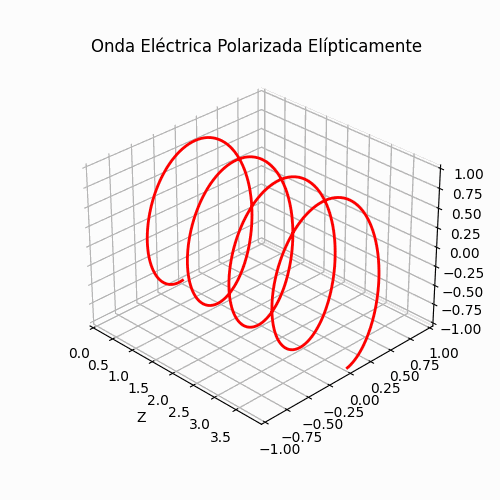

In [87]:
OndaPE = SimuladorPolarizacionEliptica(E0x = 1, E0y=0.5, theta1 = 0, theta2 = 90)
OndaPE.run()
OndaPE.animate(file_dir='Ejemplo_1.gif', az = -45)
Image(open('/content/Ejemplo_1.gif', 'rb').read())

Ejemplo 2: En este caso, usaremos una amplitud negativa para E0x y un desfase negativo. En este caso, la amplitud negativa equivale a un desfase de -180 en la primera onda, lo cual hace que el desfase neto sea de -90. Esto nos lleva a una Polarizació Elíptica con giro horario (RHEP).

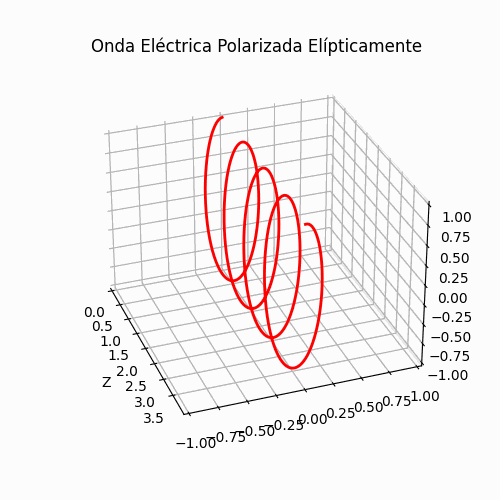

In [88]:
OndaPE = SimuladorPolarizacionEliptica(E0x = -1, E0y=0.2, theta1 = 0, theta2 = 90)
OndaPE.run()
OndaPE.animate(file_dir='Ejemplo_2.gif', az = -20)
Image(open('/content/Ejemplo_2.gif', 'rb').read())

Ejemplo 2: En este caso, usaremos desfases arbitrarios entre ambas ondas.

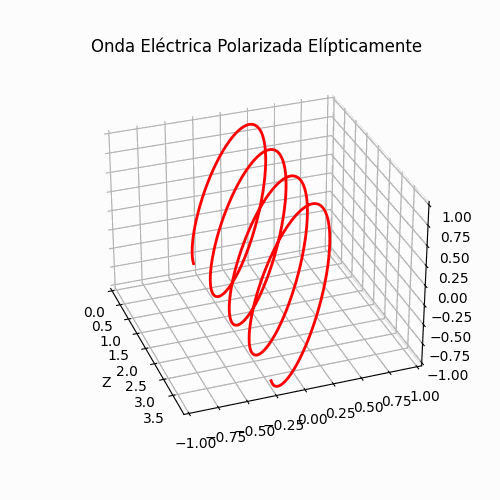

In [89]:
OndaPE = SimuladorPolarizacionEliptica(E0x = 1, E0y=0.3, theta1 = -30, theta2 = 20)
OndaPE.run()
OndaPE.animate(file_dir='Ejemplo_3.gif', az = -20)
Image(open('/content/Ejemplo_3.gif', 'rb').read())

# Problema 2: Casos Particulares

**[0.5 PUNTOS]**

LHCP: Para este caso, las magnitudes deben ser iguales y la componente y debe adelantar en 90 grados a la componente en x.

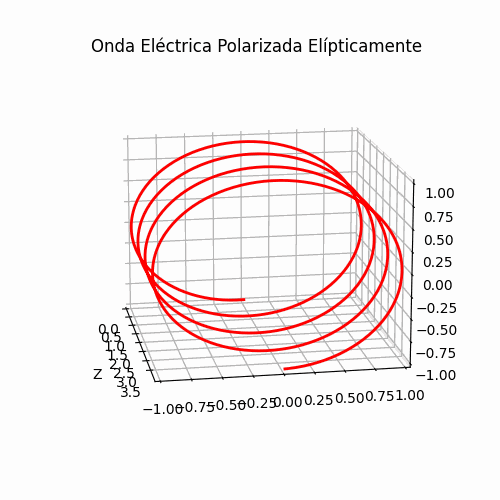

In [90]:
OndaPE = SimuladorPolarizacionEliptica(E0x = 1, E0y=1, theta1 = 0, theta2 = 90)
OndaPE.run()
OndaPE.animate(file_dir='LHCP.gif', az = -10, el=15)
Image(open('/content/LHCP.gif', 'rb').read())

**[0.5 PUNTOS]**

RHCP: Para este caso, las magnitudes deben ser iguales y la componente y debe adelantar en -90 grados a la componente en x.

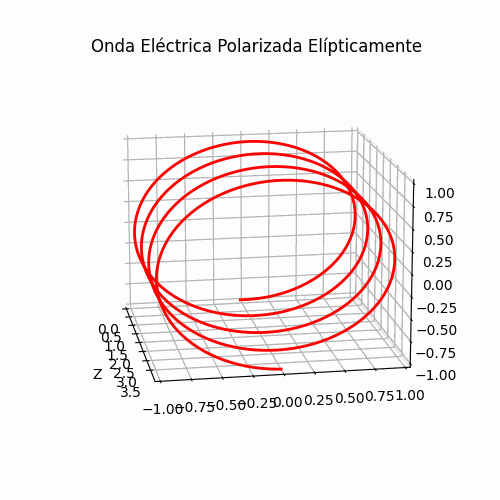

In [91]:
OndaPE = SimuladorPolarizacionEliptica(E0x = 1, E0y=1, theta1 = 0, theta2 = -90)
OndaPE.run()
OndaPE.animate(file_dir='RHCP.gif', az = -10, el=15)
Image(open('/content/RHCP.gif', 'rb').read())

**[0.5 PUNTOS]**

Lineal: Basta con que ambas ondas estén en fase.

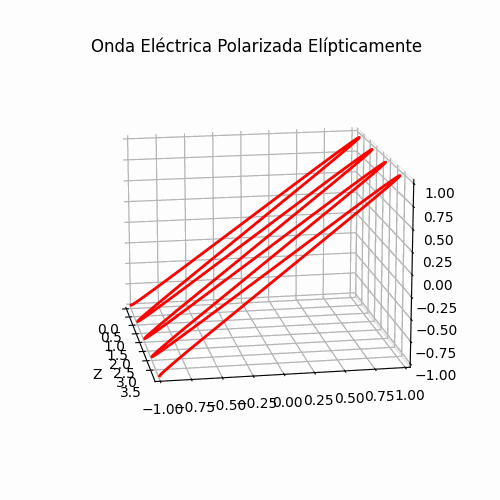

In [92]:
OndaPE = SimuladorPolarizacionEliptica(E0x = 1, E0y=1, theta1 = 0, theta2 = 0)
OndaPE.run()
OndaPE.animate(file_dir='Linear.gif', az = -10, el=15)
Image(open('/content/Linear.gif', 'rb').read())

# Pregunta 3: Estimación de Memoria

Examinemos el caso de Ex:

**[0.625 puntos]** Esta toma 200 puntos por longitud de onda, y se emplean 4 longitudes de onda. De modo que la grilla espacial utiliza 800 puntos.


**[0.625 puntos]** Además, se emplean 400 puntos por periodo, para un total de 4 periodos. De modo que la grilla temporal emplea 1600 puntos.

**[0.5 puntos]** De este modo, para la componente Ex se emplea un total de:

MEM = 800 * 1600 * 4 = 5.12 [MB]

**[0.5 puntos]** Dado que son 2 componentes las que se necesitan para generar la polarización elíptica (Ex y Ey). La memoria necesitada es de 10.24 [MB]




**OJITO** (Si alguien tuvo esta consideración, también se considera correcto)

En realidad, para garantizar que se cubra el rango completo, np.arange() necesita un punto más en cada grilla. De modo que la memoria efectiva sería de:

MEM = 801 * 1601 * 4 * 2 ≈ 10.26 [MB]

Podemos comprobar todo esto viendo las longitudes de nuestras variables.

In [93]:
vector_espacial = OndaPE.Ex_zz
vector_temporal = OndaPE.Ex_tt

#Debemos desagrupar los puntos temporales de cada frame
#para que nos de el tamaño completo
puntos_Ex       = np.array(OndaPE.Ex_tt).flatten()

#Por enunciado, cada punto ocupaba 4 bytes (32 bits),
#de modo que convertimos a float32
memoria_total   = 2 * puntos_Ex.astype('float32').nbytes

print("Número de puntos espaciales:", len(puntos_espaciales))
print("Número de puntos temporales (frames):" , len(puntos_temporales))
print("Puntos totales en Ex:", len(puntos_Ex))
print("Memoria Total en MB:", memoria_total/1000000)

Número de puntos espaciales: 801
Número de puntos temporales (frames): 1601
Puntos totales en Ex: 1282401
Memoria Total en MB: 10.259208
